Step 1
- Loaded and explored Jigsaw train.csv and all_data.csv (sample)
- Analyzed toxicity label distribution and comment lengths
- Added a binary toxic label for simplified classification
- Identified real ambiguous and obfuscated words for later use

In [38]:
# 📦 Import Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot styles
sns.set(style="whitegrid")
%matplotlib inline

 Load the Primary Dataset (train.csv)

In [39]:
# Load main Jigsaw Toxic dataset
train_df = pd.read_csv("data/train.csv")

# Show first few rows
print("Sample rows from train.csv:")
display(train_df.head())

# Show label columns
label_cols = ['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']
print("Toxic label columns:", label_cols)

Sample rows from train.csv:


,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0


Toxic label columns: ['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']


Label Distribution (Multi-label)

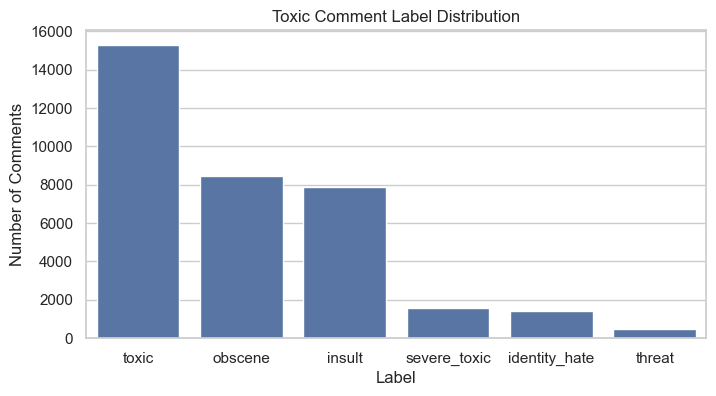

In [40]:
# Sum across label columns
label_counts = train_df[label_cols].sum().sort_values(ascending=False)

# Barplot of label frequencies
plt.figure(figsize=(8, 4))
sns.barplot(x=label_counts.index, y=label_counts.values)
plt.title("Toxic Comment Label Distribution")
plt.xlabel("Label")
plt.ylabel("Number of Comments")
plt.show()

Convert to Binary Toxic Label

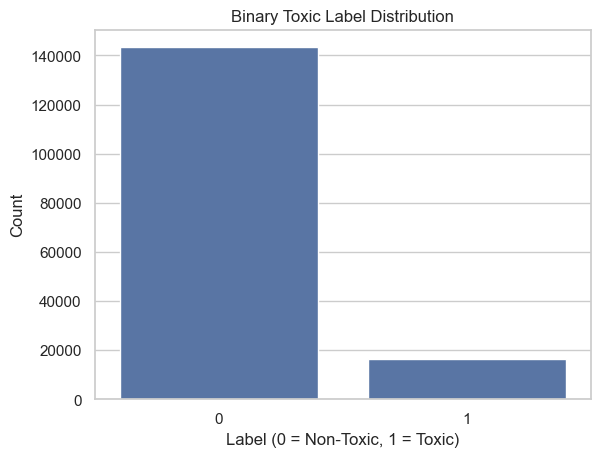

toxic_binary
0    143346
1     16225
Name: count, dtype: int64

In [41]:
# Add a binary label: toxic if any of the labels are 1
train_df['toxic_binary'] = (train_df[label_cols].sum(axis=1) > 0).astype(int)

# Distribution of binary label
sns.countplot(x='toxic_binary', data=train_df)
plt.title("Binary Toxic Label Distribution")
plt.xlabel("Label (0 = Non-Toxic, 1 = Toxic)")
plt.ylabel("Count")
plt.show()


# Show the count of toxic vs non-toxic comments
train_df['toxic_binary'].value_counts()

Comment Length Analysis

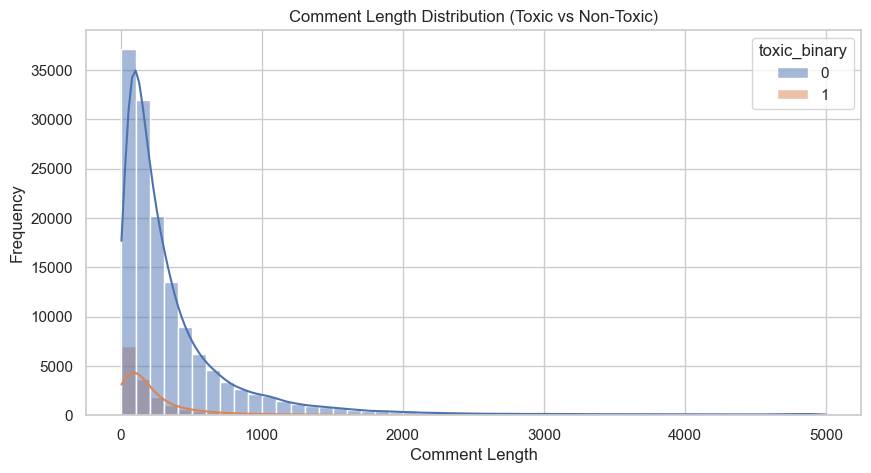

In [42]:
# Create a length feature
train_df['text_length'] = train_df['comment_text'].apply(len)

# Plot comment lengths by toxicity
plt.figure(figsize=(10, 5))
sns.histplot(data=train_df, x='text_length', hue='toxic_binary', bins=50, kde=True)
plt.title("Comment Length Distribution (Toxic vs Non-Toxic)")
plt.xlabel("Comment Length")
plt.ylabel("Frequency")
plt.show()

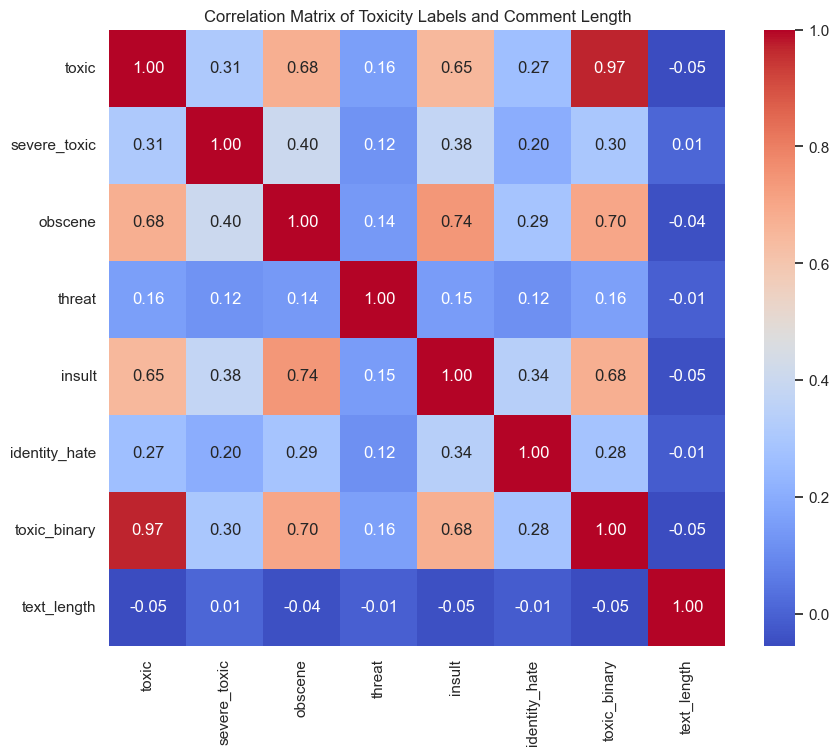

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Create text length feature
train_df['text_length'] = train_df['comment_text'].apply(len)

# Include only numerical columns for correlation (e.g., toxicity labels and text_length)
correlation_columns = [col for col in train_df.columns if train_df[col].dtype in ['int64', 'float64']]
correlation_matrix = train_df[correlation_columns].corr()

# Plot correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title("Correlation Matrix of Toxicity Labels and Comment Length")
plt.show()

Ambiguous Words in Clean vs Toxic Context

In [44]:
# Words that often get flagged inappropriately
ambiguous_words = ['pussy', 'bitch', 'kill', 'bomb', 'gay']

for word in ambiguous_words:
    toxic_count = train_df[(train_df['toxic_binary'] == 1) & (train_df['comment_text'].str.contains(word, case=False))].shape[0]
    non_toxic_count = train_df[(train_df['toxic_binary'] == 0) & (train_df['comment_text'].str.contains(word, case=False))].shape[0]
    print(f"'{word}' — Toxic: {toxic_count} | Non-Toxic: {non_toxic_count}")



    #  here i have to check whether the distribution of these examples ambigous words accross different labels.

'pussy' — Toxic: 157 | Non-Toxic: 20
'bitch' — Toxic: 849 | Non-Toxic: 60
'kill' — Toxic: 442 | Non-Toxic: 1631
'bomb' — Toxic: 55 | Non-Toxic: 390
'gay' — Toxic: 570 | Non-Toxic: 432


Load Jigsaw Unintended Bias Dataset (Sampled) - (Optional) can be used in later steps.

In [45]:
# Load a sample of the unintended bias dataset
bias_df = pd.read_csv("data/all_data.csv", nrows=100000)

# Show sample rows
print("Sample rows from all_data.csv (Unintended Bias):")
display(bias_df[['comment_text', 'toxicity']].head())

# Convert toxicity score to binary
bias_df['toxic_binary'] = (bias_df['toxicity'] > 0.5).astype(int)

# Check for Obfuscated Terms in Real-world Samples

# Look for obfuscated toxic words in bias dataset
obfuscated_terms = ['k1ll', 'b!tch', '@sshole', 'f@ggot', 'idi0t']

for word in obfuscated_terms:
    matches = bias_df[bias_df['comment_text'].str.contains(word, case=False)]
    print(f"'{word}' found in {matches.shape[0]} comments in all_data.csv")

Sample rows from all_data.csv (Unintended Bias):


,comment_text,toxicity
0,He got his money... now he lies in wait till a...,0.373134
1,Mad dog will surely put the liberals in mental...,0.605263
2,And Trump continues his lifelong cowardice by ...,0.666667
3,"""while arresting a man for resisting arrest"".\...",0.815789
4,Tucker and Paul are both total bad ass mofo's.,0.550000


'k1ll' found in 0 comments in all_data.csv
'b!tch' found in 1 comments in all_data.csv
'@sshole' found in 0 comments in all_data.csv
'f@ggot' found in 0 comments in all_data.csv
'idi0t' found in 3 comments in all_data.csv


Step 2
- Cleaned and preprocessed the text
- Created binary labels for toxicity
- Tokenized text using BERT tokenizer
- Split data into train, val, test
- Created 3 special evaluation sets:
  • ambiguous_validation_df
  • balanced_validation_df
  • adversarial_test_df
- Wrapped all into PyTorch Datasets and DataLoaders

In [46]:
import re
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizer
from sklearn.model_selection import train_test_split

# Show the count of toxic vs non-toxic comments
train_df['toxic_binary'].value_counts()

toxic_binary
0    143346
1     16225
Name: count, dtype: int64

In [47]:
# Define a function to clean text while keeping obfuscated symbols
def clean_text(text):
    text = text.lower()
    text = re.sub(r'<.*?>', '', text)  # Remove HTML
    text = re.sub(r'https?://\S+|www\.\S+', '', text)  # Remove URLs
    text = re.sub(r'[^a-z0-9\s@#$%&*!?]', '', text)  # Keep common obfuscation symbols
    text = re.sub(r'\s+', ' ', text).strip()  # Normalize spaces
    return text

# Apply cleaning
train_df['clean_text'] = train_df['comment_text'].astype(str).apply(clean_text)
for i in range(3):
    print(f"Original: {train_df['comment_text'][i]}")
    print(f"Cleaned:  {train_df['clean_text'][i]}")
    print("-" * 80)
train_df[['comment_text', 'clean_text']].head()

Original: Explanation
Why the edits made under my username Hardcore Metallica Fan were reverted? They weren't vandalisms, just closure on some GAs after I voted at New York Dolls FAC. And please don't remove the template from the talk page since I'm retired now.89.205.38.27
Cleaned:  explanation why the edits made under my username hardcore metallica fan were reverted? they werent vandalisms just closure on some gas after i voted at new york dolls fac and please dont remove the template from the talk page since im retired now892053827
--------------------------------------------------------------------------------
Original: D'aww! He matches this background colour I'm seemingly stuck with. Thanks.  (talk) 21:51, January 11, 2016 (UTC)
Cleaned:  daww! he matches this background colour im seemingly stuck with thanks talk 2151 january 11 2016 utc
--------------------------------------------------------------------------------
Original: Hey man, I'm really not trying to edit war. It's just

,comment_text,clean_text
0,Explanation\nWhy the edits made under my usern...,explanation why the edits made under my userna...
1,D'aww! He matches this background colour I'm s...,daww! he matches this background colour im see...
2,"Hey man, I'm really not trying to edit war. It...",hey man im really not trying to edit war its j...
3,"""\nMore\nI can't make any real suggestions on ...",more i cant make any real suggestions on impro...
4,"You, sir, are my hero. Any chance you remember...",you sir are my hero any chance you remember wh...


Load the BERT tokenizer (bert-base-uncased)

In [48]:
# Load pre-trained BERT tokenizer
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

Split Datasets

In [49]:
from sklearn.model_selection import train_test_split

# 80% Train, 10% Validation, 10% Test
train_df, temp_df = train_test_split(
    train_df,
    test_size=0.2,
    stratify=train_df['toxic_binary'],
    random_state=42
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.5,
    stratify=temp_df['toxic_binary'],
    random_state=42
)

# Show counts for each set
print(f"Train: {len(train_df)}")
print(f"Validation: {len(val_df)}")
print(f"Test: {len(test_df)}")

Train: 127656
Validation: 15957
Test: 15958


Create Special Evaluation Sets

In [50]:
# Define common ambiguous terms that often cause false positives
ambiguous_words = ['pussy', 'bitch', 'gay', 'kill', 'bomb']

# Filter val_df to get samples containing any ambiguous term
def contains_ambiguous(text):
    return any(word in text for word in ambiguous_words)

# Apply filter to validation set
ambiguous_validation_df = val_df[val_df['clean_text'].apply(contains_ambiguous)]

print(f" ambiguous_validation_df created with {len(ambiguous_validation_df)} samples.")

 ambiguous_validation_df created with 436 samples.


In [51]:
# we have took this because to check false positive for label toxic - in later steps.

# Count available samples in each class
num_toxic = val_df[val_df['toxic_binary'] == 1].shape[0]
num_non_toxic = val_df[val_df['toxic_binary'] == 0].shape[0]

# Choose the smaller count
sample_size = min(num_toxic, num_non_toxic)

# Sample equally from both classes
toxic_samples = val_df[val_df['toxic_binary'] == 1].sample(n=sample_size, random_state=42)
non_toxic_samples = val_df[val_df['toxic_binary'] == 0].sample(n=sample_size, random_state=42)

# Combine and shuffle
balanced_validation_df = pd.concat([toxic_samples, non_toxic_samples]).sample(frac=1, random_state=42)

print(f"✅ Balanced validation set created with {len(balanced_validation_df)} samples (Toxic: {sample_size}, Non-Toxic: {sample_size})")

✅ Balanced validation set created with 3244 samples (Toxic: 1622, Non-Toxic: 1622)


In [52]:
# Load a sample of unintended bias dataset
bias_df = pd.read_csv("data/all_data.csv", usecols=['comment_text', 'toxicity'], nrows=100000)
bias_df['toxic_binary'] = (bias_df['toxicity'] > 0.5).astype(int)

# Obfuscated term filter
obfuscated_terms = ['k1ll', 'b!tch', '@sshole', 'f@ggot', 'idi0t']

def contains_obfuscated(text):
    return any(term in text.lower() for term in obfuscated_terms)

adversarial_test_df = bias_df[bias_df['comment_text'].apply(contains_obfuscated)]
print(f"Adversarial test set: {len(adversarial_test_df)} samples")

Adversarial test set: 4 samples


Tokenization Helper and PyTorch Dataset

In [53]:
# Tokenization helper function
def tokenize_text(texts, tokenizer, max_len=128):
    return tokenizer(
        list(texts),
        padding='max_length',
        truncation=True,
        max_length=max_len,
        return_tensors="pt"
    )

class ToxicDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = list(texts)
        self.labels = labels.values
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        # Tokenize one sample at a time (faster and memory-safe)
        encoding = self.tokenizer(
            self.texts[idx],
            truncation=True,
            padding='max_length',
            max_length=self.max_len,
            return_tensors='pt'
        )
        item = {key: val.squeeze(0) for key, val in encoding.items()}  # remove batch dim
        item['labels'] = torch.tensor(self.labels[idx], dtype=torch.long)
        return item


In [113]:
import pandas as pd
pf_filter_trained_df = pd.read_csv("data/fp_filter_results_step8.csv")


test_combined = pd.read_csv("data/test_combined_predictions.csv")
print(f"Total rows: {len(test_combined)}")

print(test_combined.columns)

Total rows: 2500
Index(['id', 'comment_text', 'prediction', 'confidence'], dtype='object')


In [114]:
# Batch size for all loaders
BATCH_SIZE = 16

# Datasets
train_dataset = ToxicDataset(train_df['clean_text'], train_df['toxic_binary'], tokenizer)
val_dataset = ToxicDataset(val_df['clean_text'], val_df['toxic_binary'], tokenizer)
test_dataset = ToxicDataset(test_df['clean_text'], test_df['toxic_binary'], tokenizer)
fp_filter_dataset = ToxicDataset(pf_filter_trained_df['text'], pf_filter_trained_df['predicted_label'], tokenizer)
test_combined_dataset = ToxicDataset(test_combined['comment_text'], test_combined['prediction'], tokenizer)



# false positive datasets
fp_dataset = ToxicDataset(ambiguous_validation_df['clean_text'], ambiguous_validation_df['toxic_binary'], tokenizer)

balanced_val_dataset = ToxicDataset(balanced_validation_df['clean_text'], balanced_validation_df['toxic_binary'], tokenizer)
adversarial_test_dataset = ToxicDataset(adversarial_test_df['comment_text'], adversarial_test_df['toxic_binary'], tokenizer)

# DataLoaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE)
fp_filter_dataLoader = DataLoader(fp_filter_dataset, batch_size=BATCH_SIZE)
test_combined_dataLoader = DataLoader(test_combined_dataset, batch_size=BATCH_SIZE)

fp_loader = DataLoader(fp_dataset, batch_size=BATCH_SIZE)
balanced_val_loader = DataLoader(balanced_val_dataset, batch_size=BATCH_SIZE)
adversarial_test_loader = DataLoader(adversarial_test_dataset, batch_size=BATCH_SIZE)

print("✅ All DataLoaders are ready.")

✅ All DataLoaders are ready.


Step 5: Model development and training

In [31]:
import torch
import torch.nn as nn
from transformers import BertForSequenceClassification, get_scheduler
from torch.optim import AdamW
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np
import os
import time

Load BERT + Binary Classification Head

In [32]:
# Use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

try:
    # Load BERT model for binary classification
    model = BertForSequenceClassification.from_pretrained(
        "bert-base-uncased",
        num_labels=2  # binary classification
    )
    model.to(device)
    print("BERT model loaded and moved to device.")
except Exception as e:
    print("Error loading BERT model:", e)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BERT model loaded and moved to device.


Set Optimizer, Loss, Scheduler

In [34]:
# Set up optimizer
optimizer = AdamW(model.parameters(), lr=2e-5, weight_decay=0.01)
print("✅ Optimizer (AdamW) initialized with learning rate 2e-5 and weight decay 0.01.")

# Set number of epochs
epochs = 4
print(f"📆 Number of training epochs: {epochs}")

# Calculate total training steps
train_steps = len(train_loader) * epochs
print(f"🔁 Total training steps: {train_steps} ({len(train_loader)} batches x {epochs} epochs)")

# Set up learning rate scheduler
scheduler = get_scheduler(
    name="linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=train_steps
)
print("✅ Learning rate scheduler (linear) set up successfully.")

# Loss function
loss_fn = nn.CrossEntropyLoss()
print("✅ Loss function (CrossEntropyLoss) initialized.")

✅ Optimizer (AdamW) initialized with learning rate 2e-5 and weight decay 0.01.
📆 Number of training epochs: 4
🔁 Total training steps: 31916 (7979 batches x 4 epochs)
✅ Learning rate scheduler (linear) set up successfully.
✅ Loss function (CrossEntropyLoss) initialized.


 Helper: Compute Metrics

In [36]:
def compute_metrics(preds, labels):
    preds = np.argmax(preds, axis=1)
    accuracy = accuracy_score(labels, preds)
    precision = precision_score(labels, preds)
    recall = recall_score(labels, preds)
    f1 = f1_score(labels, preds)
    return accuracy, precision, recall, f1

 Training + Validation Function

In [37]:
def train_one_epoch(model, loader, optimizer, scheduler):
    model.train()
    total_loss = 0
    all_preds, all_labels = [], []

    print("🚀 Starting training epoch...")
    for step, batch in enumerate(loader):
        try:
            optimizer.zero_grad()
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
            loss = outputs.loss
            logits = outputs.logits

            loss.backward()
            optimizer.step()
            scheduler.step()

            total_loss += loss.item()
            all_preds.extend(logits.detach().cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            if step % 100 == 0:
                print(f"🟡 Step {step}/{len(loader)} - Loss: {loss.item():.4f}")

        except Exception as e:
            print(f"❌ Error in training batch at step {step}:", e)

    avg_loss = total_loss / len(loader)
    acc, prec, rec, f1 = compute_metrics(all_preds, all_labels)
    print("✅ Training epoch complete.")
    print(f"📊 Train Metrics → Loss: {avg_loss:.4f} | Acc: {acc:.4f} | Prec: {prec:.4f} | Rec: {rec:.4f} | F1: {f1:.4f}")
    return avg_loss, acc, prec, rec, f1


def evaluate(model, loader):
    model.eval()
    total_loss = 0
    all_preds, all_labels = [], []

    print("🔍 Starting evaluation...")
    with torch.no_grad():
        for step, batch in enumerate(loader):
            try:
                input_ids = batch['input_ids'].to(device)
                attention_mask = batch['attention_mask'].to(device)
                labels = batch['labels'].to(device)

                outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
                loss = outputs.loss
                logits = outputs.logits

                total_loss += loss.item()
                all_preds.extend(logits.detach().cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

                if step % 100 == 0:
                    print(f"🔹 Eval Step {step}/{len(loader)} - Loss: {loss.item():.4f}")

            except Exception as e:
                print(f"❌ Error in evaluation batch at step {step}:", e)

    avg_loss = total_loss / len(loader)
    acc, prec, rec, f1 = compute_metrics(all_preds, all_labels)
    print("✅ Evaluation complete.")
    print(f"📊 Val Metrics → Loss: {avg_loss:.4f} | Acc: {acc:.4f} | Prec: {prec:.4f} | Rec: {rec:.4f} | F1: {f1:.4f}")
    return avg_loss, acc, prec, rec, f1

Train Loop with Early Stopping + Logging + Checkpoint

In [38]:
# # Create output directory
# os.makedirs("checkpoints", exist_ok=True)

# best_val_f1 = 0
# patience = 2
# wait = 0

# for epoch in range(epochs):
#     print(f"\n Epoch {epoch + 1}/{epochs}")

#     start_time = time.time()

#     train_loss, train_acc, train_prec, train_rec, train_f1 = train_one_epoch(model, train_loader, optimizer, scheduler)
#     val_loss, val_acc, val_prec, val_rec, val_f1 = evaluate(model, val_loader)

#     print(f"Train | Loss: {train_loss:.4f}, Acc: {train_acc:.4f}, Prec: {train_prec:.4f}, Rec: {train_rec:.4f}, F1: {train_f1:.4f}")
#     print(f"Val   | Loss: {val_loss:.4f}, Acc: {val_acc:.4f}, Prec: {val_prec:.4f}, Rec: {val_rec:.4f}, F1: {val_f1:.4f}")

#     # Early stopping check
#     if val_f1 > best_val_f1:
#         best_val_f1 = val_f1
#         wait = 0
#         torch.save(model.state_dict(), "checkpoints/best_model.pt")
#         print("Model improved. Saved to checkpoints.")
#     else:
#         wait += 1
#         if wait >= patience:
#             print("⛔ Early stopping triggered.")
#             break

#     print(f"Epoch duration: {time.time() - start_time:.2f} seconds")

1st on Jigsaw 5 classes Dataset and validation datasets

we havent used Unintended

You’ve validated that:
	•	Your fine-tuned BERT model is trained properly.
	•	It performs strongly even on held-out (unseen) data.
	•	You’ve reached a solid performance baseline.

Load the saved model:

In [ ]:
model = torch.load("checkpoints/best_model_1.pkl", map_location=torch.device('cpu'))
model.eval()

test_loss, test_acc, test_prec, test_rec, test_f1 = evaluate(model, test_loader)

print(f"\n🧪 Test Set Evaluation:")
print(f"Loss: {test_loss:.4f} | Acc: {test_acc:.4f} | Prec: {test_prec:.4f} | Rec: {test_rec:.4f} | F1: {test_f1:.4f}")

NameError: name 'evaluate' is not defined

In [167]:
# ✅ Step 6: Explanation Engine Using SHAP

import shap
import torch
from transformers import BertTokenizer, BertForSequenceClassification, pipeline
import matplotlib.pyplot as plt
import numpy as np
import os

# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [169]:
model_path = "checkpoints/best_model_2.pkl"
try:
    tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
    model = torch.load(model_path, map_location=device)
    model.to(device)
    model.eval()
    print("✅ Model and tokenizer loaded successfully.")
except Exception as e:
    print("❌ Error loading model or tokenizer:", e)


# from transformers import BertTokenizer, BertForSequenceClassification
# import torch

# model_path = "checkpoints/best_model_step7.pt"

# try:
#     # Step 1: Load tokenizer
#     tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

#     # Step 2: Define the model architecture (same as during training)
#     model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=2)

#     # Step 3: Load saved weights from .pt file
#     model.load_state_dict(torch.load(model_path, map_location=torch.device("cuda" if torch.cuda.is_available() else "cpu")))

#     # Step 4: Move model to device and eval mode
#     model.to(device)
#     model.eval()

#     print("✅ Model weights loaded from .pt and model ready.")

# except Exception as e:
#     print("❌ Error loading model or tokenizer:", e)

✅ Model and tokenizer loaded successfully.


In [170]:
# Step 2: Create pipeline for SHAP
try:
    classifier = pipeline(
        "text-classification",
        model=model,
        tokenizer=tokenizer,
        return_all_scores=True,
        device=0 if torch.cuda.is_available() else -1
    )
    print("✅ Hugging Face pipeline created successfully.")
except Exception as e:
    print("❌ Error creating pipeline:", e)

Device set to use cpu


✅ Hugging Face pipeline created successfully.


In [171]:
# Step 3: Initialize SHAP explainer
try:
    explainer = shap.Explainer(classifier)
    print("✅ SHAP Explainer initialized.")
except Exception as e:
    print("❌ Error initializing SHAP explainer:", e)

✅ SHAP Explainer initialized.


In [172]:
# Step 4: Define sample texts (clean, ambiguous, adversarial)
examples = {
    "clean": "Thanks for your help! I really appreciate it.",
    "ambiguous": "That guy is so gay, like really.",
    "adversarial": "Go k1ll urself, l00ser."
}

In [46]:
import shap
import pandas as pd

# Load test comments
test_df = pd.read_csv("data/test.csv")
sample_texts = test_df['comment_text'].dropna().head(5).tolist()

# Step 1: Initialize SHAP explainer
try:
    print("\n🔍 Initializing SHAP explainer...")
    explainer = shap.Explainer(classifier)
except Exception as e:
    print("❌ SHAP initialization error:", e)

# Create explanations dictionary for later use (e.g., Jaccard)
explanations = {}

# Step 2: Run SHAP explanations on test comments
for i, text in enumerate(sample_texts):
    try:
        print(f"\n📌 Explaining Test Sample {i+1}")
        print(f"📝 Input: {text}")

        # Predict toxicity using classifier pipeline
        prediction = classifier(text)[0]
        toxic_score = next((item['score'] for item in prediction if item['label'] == 'LABEL_1'), None)
        pred_label = "Toxic" if toxic_score is not None and toxic_score > 0.5 else "Non-Toxic"

        print(f"🔎 Prediction: {pred_label} (Confidence: {toxic_score:.4f})")

        # Run SHAP and store explanation
        shap_values = explainer([text])
        explanations[f"sample_{i+1}"] = shap_values

        # Try text plot; fallback if fails
        try:
            shap.plots.text(shap_values[0])
        except Exception as plot_error:
            print("⚠️ Could not render SHAP text plot. Falling back to summary.")
            print(shap_values[0])

    except Exception as e:
        print(f"❌ Error explaining sample {i+1}:", e)


🔍 Initializing SHAP explainer...

📌 Explaining Test Sample 1
📝 Input: Yo bitch Ja Rule is more succesful then you'll ever be whats up with you and hating you sad mofuckas...i should bitch slap ur pethedic white faces and get you to kiss my ass you guys sicken me. Ja rule is about pride in da music man. dont diss that shit on him. and nothin is wrong bein like tupac he was a brother too...fuckin white boys get things right next time.,
🔎 Prediction: Toxic (Confidence: 0.9986)


PartitionExplainer explainer: 2it [00:21, 21.10s/it]               



📌 Explaining Test Sample 2
📝 Input: == From RfC == 

 The title is fine as it is, IMO.
🔎 Prediction: Non-Toxic (Confidence: 0.0010)



📌 Explaining Test Sample 3
📝 Input: " 

 == Sources == 

 * Zawe Ashton on Lapland —  /  "
🔎 Prediction: Non-Toxic (Confidence: 0.0020)



📌 Explaining Test Sample 4
📝 Input: :If you have a look back at the source, the information I updated was the correct form. I can only guess the source hadn't updated. I shall update the information once again but thank you for your message.
🔎 Prediction: Non-Toxic (Confidence: 0.0003)


PartitionExplainer explainer: 2it [00:13, 13.24s/it]               



📌 Explaining Test Sample 5
📝 Input: I don't anonymously edit articles at all.
🔎 Prediction: Non-Toxic (Confidence: 0.0044)


In [173]:
# # ✅ Step 1: Define clean vs obfuscated example
examples = {
    "clean": "are you okay ",
    "obfuscated": "You’re a use!ess p@thetic excuse for a human."
}

# ✅ Step 2: SHAP + Predictions for each
explanations = {}
predicted_labels = {}

for label, sentence in examples.items():
    try:
        print(f"\n📌 Explaining {label.upper()} sample: {sentence}")

        # Get SHAP explanation
        shap_values = explainer([sentence])
        explanations[label] = shap_values
        shap.plots.text(shap_values[0])  # Optional: Plot

        # Get model prediction
        inputs = tokenizer(sentence, return_tensors="pt", truncation=True, padding=True).to(device)
        with torch.no_grad():
            outputs = model(**inputs)
            pred = torch.argmax(outputs.logits, dim=1).item()

        predicted_labels[label] = "Toxic" if pred == 1 else "Non-Toxic"
        print(f"🧠 Predicted label for {label.upper()}: {predicted_labels[label]}")

        # 🔍 Extract most influential tokens for LABEL_1 (toxic)
        if pred == 1:
            tokens = shap_values[0].data
            scores = shap_values[0].values[:, 1]  # Class 1 = toxic
            top_contributors = sorted(zip(tokens, scores), key=lambda x: abs(x[1]), reverse=True)[:5]
            print("🔥 Top toxic-contributing tokens:")
            for token, value in top_contributors:
                print(f"   • {token} → SHAP: {value:.4f}")

    except Exception as e:
        print(f"❌ Error for {label}:", e)

        # ✅ Step 3: Compute Jaccard Overlap between tokens
def jaccard_overlap(set1, set2):
    return len(set1 & set2) / len(set1 | set2) if set1 or set2 else 0

try:
    tokens_clean = set(explanations['clean'].data[0])
    tokens_obf = set(explanations['obfuscated'].data[0])
    score = jaccard_overlap(tokens_clean, tokens_obf)
    print(f"\n🔢 Jaccard Overlap (Clean vs Obfuscated): {score:.4f}")
except Exception as e:
    print("❌ Could not compute Jaccard index:", e)


📌 Explaining CLEAN sample: are you okay 


🧠 Predicted label for CLEAN: Non-Toxic

📌 Explaining OBFUSCATED sample: You’re a use!ess p@thetic excuse for a human.


PartitionExplainer explainer: 2it [00:10, 10.97s/it]               


🧠 Predicted label for OBFUSCATED: Non-Toxic

🔢 Jaccard Overlap (Clean vs Obfuscated): 0.1053


In [ ]:
# Step 8: Save results for test samples
try:
    with open("shap_explanations_test/explanation_log.txt", "w") as f:
        for i, text in enumerate(sample_texts):
            prediction = classifier(text)
            f.write(f"\n[TEST SAMPLE {i + 1}] INPUT:\n{text}\n")
            f.write(f"Prediction:\n{prediction}\n")
    print("📁 All explanation results for test samples logged successfully at shap_explanations_test/explanation_log.txt")
except Exception as e:
    print("❌ Could not save explanation log:", e)

📁 All explanation results for test samples logged successfully at shap_explanations_test/explanation_log.txt


Step 7 Adversarial Robustness Integration

OpenAttack expects a wrapper class like this:

Filter Toxic Samples

we are doing for step 7 testing and evaluation

In [48]:
# ✅ Load datasets

import pandas as pd
from IPython.display import display
import torch
from transformers import BertTokenizer, BertForSequenceClassification, get_scheduler
from torch.utils.data import Dataset, DataLoader
from torch.optim import AdamW
import torch.nn as nn
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np
import os
import time
import matplotlib.pyplot as plt


clean_df = pd.read_csv("data/train.csv")
adv_df = pd.read_csv("data/adversarial_train_full_ALL.csv")

In [49]:

# ✅ Display columns and count
print("📄 Columns in adversarial dataset:")
print(adv_df.columns.tolist())

# ✅ Process adversarial dataset if correct columns exist
if 'adversarial_text' in adv_df.columns and 'label' in adv_df.columns:
    # Select and rename columns
    adv_df = adv_df[['adversarial_text', 'label']].rename(columns={'adversarial_text': 'text'})

    # ✅ Downsample to 90,000 samples for optimal training
    adv_df = adv_df.sample(n=90000, random_state=42).reset_index(drop=True)
    print(f"✅ Loaded adversarial dataset with {len(adv_df)} samples.")

    print("✅ Downsampled and prepared adversarial dataset (90k samples):")
    print(adv_df.head(2))
else:
    print("❌ Required columns not found. Please check the CSV structure.")

📄 Columns in adversarial dataset:
['original_text', 'adversarial_text', 'toxicity', 'label']
✅ Loaded adversarial dataset with 90000 samples.
✅ Downsampled and prepared adversarial dataset (90k samples):
                                                text  label
0            TSA will require compliant IDs in 2018.      1
1  The house of cadres is falling with slow but s...      1


In [50]:

# If label column doesn't exist, infer it using toxicity > 0.5 or 0.2
if "label" not in clean_df.columns:
    clean_df["label"] = (clean_df.iloc[:, 2:8].max(axis=1) >= 0.5).astype(int)

# Select and rename columns
clean_df = clean_df[["comment_text", "label"]]
clean_df = clean_df.rename(columns={"comment_text": "text"})

print(f"✅ Loaded clean dataset with {len(clean_df)} samples.")
print(clean_df.head(2))

✅ Loaded clean dataset with 159571 samples.
                                                text  label
0  Explanation\nWhy the edits made under my usern...      0
1  D'aww! He matches this background colour I'm s...      0


In [51]:
import pandas as pd
from IPython.display import display

# ✅ Step 4: Combine clean and adversarial data
full_train_df = pd.concat([clean_df, adv_df], ignore_index=True)

# Shuffle the combined dataset
full_train_df = full_train_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Show all columns and display 5 sample rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

print(f"✅ Combined dataset has {len(full_train_df)} samples.")
print("\n🔢 Label distribution:")
print(full_train_df['label'].value_counts())

# Display full DataFrame (top 5 rows)
print("\n📄 Sample rows from combined dataset:")
display(full_train_df.head(5))

✅ Combined dataset has 249571 samples.

🔢 Label distribution:
label
0    143346
1    106225
Name: count, dtype: int64

📄 Sample rows from combined dataset:


,text,label
0,"""\nSleep? You're not allowed to do that! 247 """,0
1,"Such a theory, in fact pure POV, show obviously a bad knowledge of French and Occitan linguistics.",0
2,Are you saying that the CIA should only say things that Trump likes?,1
3,"I'm looking forward to trying the beet and kale pizza. Yum! Thank you! I am however, very disappointed in these meat dishes--that people are still interested in eating other living beings that want to be happy and free from suffering just like us. There's just no good reason for most of us in this modern world to be supporting unnecessary suffering and death of animals.",1
4,"Are you sure you understand English? If Trump does what he says he is going to do, create millions of jobs, bring a lot of manufacturing back to the country, create a booming economy with tax cuts to stimulate the economy, pay down the countries debt with GDP growth a whole lot greater than the current 2%, etc., the question was, what are you going to do if Trump does what he says he is going to do? If he does, are you going to be willing to admit that the democrats conned you?",1


In [52]:
# Use GPU if available


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

try:
    # Load BERT model for binary classification
    model = BertForSequenceClassification.from_pretrained(
        "bert-base-uncased",
        num_labels=2  # binary classification
    )
    model.to(device)
    print("BERT model loaded and moved to device.")
except Exception as e:
    print("Error loading BERT model:", e)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BERT model loaded and moved to device.


In [53]:
# this  is alrerady done in above steps so need to change this in later times

# Initialize tokenizer
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

# Custom Dataset class
class ToxicCommentsDataset(torch.utils.data.Dataset):
    def __init__(self, df, tokenizer, max_length=128):
        self.tokenizer = tokenizer
        self.texts = df['text'].tolist()
        self.labels = df['label'].tolist()
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        encoded = self.tokenizer(
            self.texts[idx],
            padding='max_length',
            truncation=True,
            max_length=self.max_length,
            return_tensors="pt"
        )
        return {
            'input_ids': encoded['input_ids'].squeeze(0),
            'attention_mask': encoded['attention_mask'].squeeze(0),
            'labels': torch.tensor(self.labels[idx], dtype=torch.long)
        }

# Create DataLoader
full_train_dataset = ToxicCommentsDataset(full_train_df, tokenizer)
full_train_loader = DataLoader(full_train_dataset, batch_size=16, shuffle=True)

print(f"✅ full_train_loader is ready with {len(full_train_loader)} batches.")

✅ full_train_loader is ready with 15599 batches.


In [54]:
# this  is alrerady done in above steps so need to change this in later times


# ✅ Set up optimizer (using your model)
optimizer = AdamW(model.parameters(), lr=2e-5, weight_decay=0.01)
print("✅ Optimizer (AdamW) initialized with learning rate 2e-5 and weight decay 0.01.")

# ✅ Set number of epochs
epochs = 4
print(f"📆 Number of training epochs: {epochs}")

# ✅ Use full_train_loader (from merged dataset)
train_steps = len(full_train_loader) * epochs
print(f"🔁 Total training steps: {train_steps} ({len(full_train_loader)} batches x {epochs} epochs)")

# ✅ Scheduler for learning rate warm-up and decay
scheduler = get_scheduler(
    name="linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=train_steps
)
print("✅ Learning rate scheduler (linear) set up successfully.")

# ✅ CrossEntropyLoss for binary classification
loss_fn = nn.CrossEntropyLoss()
print("✅ Loss function (CrossEntropyLoss) initialized.")

✅ Optimizer (AdamW) initialized with learning rate 2e-5 and weight decay 0.01.
📆 Number of training epochs: 4
🔁 Total training steps: 62396 (15599 batches x 4 epochs)
✅ Learning rate scheduler (linear) set up successfully.
✅ Loss function (CrossEntropyLoss) initialized.


In [55]:


# ✅ Compute metrics for predictions
def compute_metrics(preds, labels):
    """
    Computes accuracy, precision, recall, and F1-score.

    Args:
        preds (np.ndarray): Model predictions (logits).
        labels (np.ndarray or list): Ground truth labels.

    Returns:
        Tuple: (accuracy, precision, recall, f1_score)
    """
    preds = np.argmax(preds, axis=1)  # Convert logits to class labels
    accuracy = accuracy_score(labels, preds)
    precision = precision_score(labels, preds)
    recall = recall_score(labels, preds)
    f1 = f1_score(labels, preds)
    return accuracy, precision, recall, f1

In [56]:
# ✅ Training Function
def train_one_epoch(model, loader, optimizer, scheduler):
    model.train()
    total_loss = 0
    all_preds, all_labels = [], []

    print("🚀 Starting training epoch...")
    for step, batch in enumerate(loader):
        try:
            optimizer.zero_grad()
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
            loss = outputs.loss
            logits = outputs.logits

            loss.backward()
            optimizer.step()
            scheduler.step()

            total_loss += loss.item()
            all_preds.extend(logits.detach().cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            if step % 100 == 0:
                print(f"🟡 Step {step}/{len(loader)} - Loss: {loss.item():.4f}")

        except Exception as e:
            print(f"❌ Error at step {step}: {e}")

    avg_loss = total_loss / len(loader)
    acc, prec, rec, f1 = compute_metrics(all_preds, all_labels)

    print("✅ Training complete.")
    print(f"📊 Train → Loss: {avg_loss:.4f} | Acc: {acc:.4f} | Prec: {prec:.4f} | Rec: {rec:.4f} | F1: {f1:.4f}")
    return avg_loss, acc, prec, rec, f1


    # ✅ Evaluation Function
def evaluate(model, loader):
    model.eval()
    total_loss = 0
    all_preds, all_labels = [], []

    print("🔍 Starting evaluation...")
    with torch.no_grad():
        for step, batch in enumerate(loader):
            try:
                input_ids = batch['input_ids'].to(device)
                attention_mask = batch['attention_mask'].to(device)
                labels = batch['labels'].to(device)

                outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
                loss = outputs.loss
                logits = outputs.logits

                total_loss += loss.item()
                all_preds.extend(logits.detach().cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

                if step % 100 == 0:
                    print(f"🔹 Eval Step {step}/{len(loader)} - Loss: {loss.item():.4f}")

            except Exception as e:
                print(f"❌ Error at eval step {step}: {e}")

    avg_loss = total_loss / len(loader)
    acc, prec, rec, f1 = compute_metrics(all_preds, all_labels)

    print("✅ Evaluation complete.")
    print(f"📊 Val → Loss: {avg_loss:.4f} | Acc: {acc:.4f} | Prec: {prec:.4f} | Rec: {rec:.4f} | F1: {f1:.4f}")
    return avg_loss, acc, prec, rec, f1

In [60]:


# # Create output directory
# os.makedirs("/content/drive/MyDrive/Toxic Comment_ML/checkpoints", exist_ok=True)

# # Early stopping setup
# best_val_f1 = 0
# patience = 2
# wait = 0

# # Lists for plotting
# train_losses = []
# val_losses = []
# train_f1s = []
# val_f1s = []

# # Epoch loop
# for epoch in range(epochs):
#     print(f"\n📅 Epoch {epoch + 1}/{epochs}")
#     start_time = time.time()

#     # 🔁 Train one epoch
#     train_loss, train_acc, train_prec, train_rec, train_f1 = train_one_epoch(
#         model, full_train_loader, optimizer, scheduler
#     )

#     # 🔍 Evaluate on validation set
#     val_loss, val_acc, val_prec, val_rec, val_f1 = evaluate(model, val_loader)

#     # Save metrics
#     train_losses.append(train_loss)
#     val_losses.append(val_loss)
#     train_f1s.append(train_f1)
#     val_f1s.append(val_f1)

#     # Summary
#     print(f"📈 Epoch {epoch + 1} Summary:")
#     print(f"Train → Loss: {train_loss:.4f}, F1: {train_f1:.4f}")
#     print(f"Val   → Loss: {val_loss:.4f}, F1: {val_f1:.4f}")

#     # Checkpoint if improved
#     if val_f1 > best_val_f1:
#         best_val_f1 = val_f1
#         wait = 0
#         model_path = "/content/drive/MyDrive/Toxic Comment_ML/checkpoints/best_model_step7.pkl"
#         torch.save(model, model_path)
#         print(f"✅ Model improved. Saved to: {model_path}")
#     else:
#         wait += 1
#         print(f"⏳ No improvement. Patience: {wait}/{patience}")
#         if wait >= patience:
#             print("⛔ Early stopping triggered.")
#             break

#     print(f"🕒 Epoch time: {time.time() - start_time:.2f} sec")



In [61]:
# # ✅ Plot loss and F1 score
# epochs_range = list(range(1, len(train_losses) + 1))

# plt.figure(figsize=(12, 5))

# # Loss Plot
# plt.subplot(1, 2, 1)
# plt.plot(epochs_range, train_losses, label="Train Loss", marker='o')
# plt.plot(epochs_range, val_losses, label="Val Loss", marker='o')
# plt.title("Loss Across Epochs")
# plt.xlabel("Epoch")
# plt.ylabel("Loss")
# plt.legend()
# plt.grid(True)

# # F1 Score Plot
# plt.subplot(1, 2, 2)
# plt.plot(epochs_range, train_f1s, label="Train F1", marker='o')
# plt.plot(epochs_range, val_f1s, label="Val F1", marker='o')
# plt.title("F1 Score Across Epochs")
# plt.xlabel("Epoch")
# plt.ylabel("F1 Score")
# plt.legend()
# plt.grid(True)

# plt.tight_layout()
# plt.savefig("/content/drive/MyDrive/Toxic Comment_ML/training_plot_step7.png")
# plt.show()
# print("📸 Plot saved to: training_plot_step7.png")

In [63]:
import pandas as pd

test_df = pd.read_csv("/Users/madhveshchokshi/Documents/Graduate MAC Docs/Term 2/Machine Learning/Project/toxicity-detector/data/Adversarial_Training_Data__5000__.csv")
print(f"✅ Loaded test dataset with {len(test_df)} samples.")
print(test_df.head())

✅ Loaded test dataset with 5000 samples.
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               

In [64]:
model = torch.load("/Users/madhveshchokshi/Documents/Graduate MAC Docs/Term 2/Machine Learning/Project/toxicity-detector/checkpoints/best_model_step7_2.pkl", map_location=torch.device('cpu'))
model.eval()

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [65]:
from torch.utils.data import DataLoader, Dataset
from transformers import BertTokenizer

tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

class ToxicTestDataset(Dataset):
    def __init__(self, df):
        self.texts = df["adversarial_text"].tolist()
        self.labels = df["label"].tolist()

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        inputs = tokenizer(self.texts[idx], truncation=True, padding='max_length', max_length=128, return_tensors="pt")
        item = {
            'input_ids': inputs['input_ids'].squeeze(0),
            'attention_mask': inputs['attention_mask'].squeeze(0),
            'labels': torch.tensor(self.labels[idx], dtype=torch.long)
        }
        return item

test_dataset = ToxicTestDataset(test_df)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
print(f"✅ Test loader ready with {len(test_loader)} batches.")

✅ Test loader ready with 157 batches.


In [66]:

# Assuming `model` is your trained BERT model from step 7
test_loss, test_acc, test_prec, test_rec, test_f1 = evaluate(model, test_loader)

print("\n📊 Final Evaluation on Mixed (Clean + Ambiguous + Adversarial) Test Set")
print(f"Loss: {test_loss:.4f}, Accuracy: {test_acc:.4f}, Precision: {test_prec:.4f}, Recall: {test_rec:.4f}, F1 Score: {test_f1:.4f}")

🔍 Starting evaluation...
🔹 Eval Step 0/157 - Loss: 0.0879
🔹 Eval Step 100/157 - Loss: 0.5113
✅ Evaluation complete.
📊 Val → Loss: 0.5645 | Acc: 0.8898 | Prec: 1.0000 | Rec: 0.8898 | F1: 0.9417

📊 Final Evaluation on Mixed (Clean + Ambiguous + Adversarial) Test Set
Loss: 0.5645, Accuracy: 0.8898, Precision: 1.0000, Recall: 0.8898, F1 Score: 0.9417


Evaluation Data

In [67]:
test_df = pd.read_csv("data/adversarial_train_finalist.csv")

# Columns: original_text, adversarial_text, label
print(test_df[['original_text', 'adversarial_text', 'label']].head(2))

                                                                                                                                                                                  original_text  \
0  He got his money... now he lies in wait till after the election in 2 yrs.... dirty politicians need to be afraid of Tar and feathers again... but they aren't and so the people get screwed.   
1                                                                                                                              Mad dog will surely put the liberals in mental hospitals. Boorah   

                                                                                                                                                                               adversarial_text  \
0  He got his money... now he lies in wait till after the election in 2 yrs.... dirty politicians need to be afraid of Tar and feathers again... but they aren't and so the people get screwed.   
1                       

In [ ]:
def predict(texts):
    model.eval()
    predictions = []
    with torch.no_grad():
        for text in texts:
            inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True)
            outputs = model(**inputs)
            pred = torch.argmax(outputs.logits, dim=1).item()
            predictions.append(pred)
    return predictions

# Get predictions
clean_preds = predict(test_df['original_text'].tolist())
adv_preds = predict(test_df['adversarial_text'].tolist())
true_labels = test_df['label'].tolist()

In [1]:
# from sklearn.metrics import classification_report

# print("📊 Clean Input Performance")
# print(classification_report(true_labels, clean_preds, digits=4))

# print("\n📊 Adversarial Input Performance")
# print(classification_report(true_labels, adv_preds, digits=4))

In [4]:
# plt.figure(figsize=(8, 5))
# plt.plot(metrics, clean_scores, marker='o', label="Clean", color='blue')
# plt.plot(metrics, adv_scores, marker='o', label="Adversarial", color='red')

# plt.ylabel("Score")
# plt.title("📉 Metric Drop from Clean → Adversarial Inputs")
# plt.ylim(0.85, 1.02)
# plt.grid(True, linestyle='--', alpha=0.7)
# plt.legend()
# plt.tight_layout()
# plt.show()

step 7 last step

create ambigous training set

In [15]:
import pandas as pd
import re

# ✅ Load your main dataset
df = pd.read_csv("/content/drive/MyDrive/Toxic Comment_ML/data/train.csv")  # or test.csv

# ✅ Define ambiguous keywords (expand if needed)
ambiguous_words = [
    "gay", "queer", "black", "white", "jew", "muslim", "islam", "christian", "brown",
    "female", "woman", "man", "asian", "indian", "african", "fat", "skinny", "sex",
    "gender", "trans", "homo", "straight", "race", "nationality", "religion"
]

# ✅ Combine into regex
ambiguous_pattern = r'\b(?:' + '|'.join(re.escape(word) for word in ambiguous_words) + r')\b'

# ✅ Filter: Non-toxic (label == 0) AND contains ambiguous terms
ambiguous_df = df[
    (df['toxic'] == 0) &
    df['comment_text'].str.contains(ambiguous_pattern, flags=re.IGNORECASE, na=False)
].copy()

# ✅ Save for further use
ambiguous_df.to_csv("/content/drive/MyDrive/Toxic Comment_ML/data/ambiguous_non_toxic_3019.csv", index=False)
print(f"✅ Found {len(ambiguous_df)} ambiguous non-toxic samples.")
print(ambiguous_df[['comment_text']].head(3))

✅ Found 8978 ambiguous non-toxic samples.
                                         comment_text
2   Hey man, I'm really not trying to edit war. It...
11  bbq \n\nbe a man and lets discuss it-maybe ove...
35  "\n\nNot at all, you are making a straw man ar...


Step 8. Ambigous check

In [21]:
import pandas as pd

# Load clean dataset
clean_df = pd.read_csv("data/ambiguous_non_toxic_3019.csv")

# List of ambiguous terms (example)
ambiguous_terms_extended = [
    "gay", "stupid", "trash", "dumb", "jerk", "crazy", "ugly", "freak", "lame", "weird",
    "loser", "fool", "idiot", "silly", "insane", "bitch", "hell", "nuts", "screw", "moron",
    "psycho", "sick", "lazy", "kill", "pathetic", "shut up", "mad", "gross", "pain", "toxic"
]

# Extract potentially ambiguous non-toxic examples
ambiguous_fp_df = clean_df[
    (clean_df['toxic'] == 0) &
    (clean_df['comment_text'].str.contains('|'.join(ambiguous_terms_extended), case=False, na=False))
].copy()

print(f"✅ Found {len(ambiguous_fp_df)} non-toxic comments containing ambiguous terms.")
print(ambiguous_fp_df.head(5))

import pandas as pd

print(df.columns)

✅ Found 2776 non-toxic comments containing ambiguous terms.
                  id                                       comment_text  \
4   001d874a4d3e8813  "::::Jmabel; in regards to predominant scholar...   
11  00510c3d06745849  Ahh, Hello Witzeman \n\n203.92.84.161  \nSymbo...   
12  006854d70298693e  Hi \n\nHi, good day.\n\nMy deepest apologies t...   
14  006d11791d76b9f3  REPLY ABOVE:\nThat was me, loser. The UN defin...   
16  007e1e47cd0e2fec  Homosexuals are intent on legitimizing their b...   

    toxic  severe_toxic  obscene  threat  insult  identity_hate  
4       0             0        0       0       0              0  
11      0             0        0       0       0              0  
12      0             0        0       0       0              0  
14      0             0        0       0       1              0  
16      0             0        0       0       0              0  


NameError: name 'df' is not defined

In [109]:
# # Step 2: Clean the dataset
# df = df[df['comment_text'].notnull()]
# # df = df[df['comment_text'].str.strip().str.len() > 3]
# df = df.reset_index(drop=True)

# print(f"✅ Filtered ambiguous dataset. Final size: {len(df)} samples")
# print(df['comment_text'].head(5).to_string(index=False))

In [24]:
import shap
import torch
from transformers import BertTokenizer, BertForSequenceClassification

# Step 3.1: Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Step 3.2: Load tokenizer and trained model (you trained in Step 7)
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=2)
model.load_state_dict(torch.load("checkpoints/best_model_step7.pt", map_location=device))
model.to(device)
model.eval()
print("✅ Model and tokenizer loaded.")

from transformers import pipeline
import shap

# ✅ Load pipeline
pipe = pipeline(
    "text-classification",
    model=model,
    tokenizer=tokenizer,
    device=0 if torch.cuda.is_available() else -1,
    truncation=True,
    max_length=512
)

# ✅ Wrap SHAP explainer
explainer = shap.Explainer(lambda x: pipe(x, truncation=True, max_length=512), tokenizer)
print("✅ SHAP explainer ready with pipeline.")

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Device set to use cpu


✅ Model and tokenizer loaded.
✅ SHAP explainer ready with pipeline.


In [27]:
import pandas as pd
import torch
import shap
import numpy as np
from transformers import BertTokenizer, BertForSequenceClassification

# ✅ Load your ambiguous dataset
df = ambiguous_fp_df.reset_index(drop=True)

# ✅ Ensure 'comment_text' is string type (prevents SHAP input errors)
df['comment_text'] = df['comment_text'].astype(str)

# ✅ Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# ✅ Load model/tokenizer
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=2)
model.load_state_dict(torch.load("checkpoints/best_model_step7.pt", map_location='cuda' if torch.cuda.is_available() else 'cpu'))
model.eval()

# ✅ Classifier pipeline
classifier = pipeline("text-classification", model=model, tokenizer=tokenizer, device=0 if torch.cuda.is_available() else -1)

Device: cpu


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Device set to use cpu


In [28]:
import shap

# ✅ SHAP with pipeline
explainer = shap.Explainer(classifier)
print("✅ SHAP Explainer initialized.")

✅ SHAP Explainer initialized.


Rule-Based Post-Filtering Logic.

In [15]:
# from tqdm import tqdm
# import numpy as np

# # # Optional: remove very long samples
# df = df[df['comment_text'].str.len() < 512].reset_index(drop=True)

# results = []

# for i, row in tqdm(df.iterrows(), total=len(df)):
#     text = str(row['comment_text']).strip()

#     if len(text) < 3:
#         continue

#     try:
#         # ➤ Get prediction and confidence
#         output = classifier(text)[0]
#         predicted_label = 1 if output['label'] == 'LABEL_1' else 0
#         confidence = output['score']

#         # ➤ SHAP values
#         shap_vals = explainer([text])
#         token_importance = shap_vals[0].values

#         # ➤ Fix: Use np.sum instead of ambiguous sum()
#         important_tokens = np.sum(np.abs(token_importance) > 0.1)

#         # ➤ Apply rule-based FP filter
#         flag = "Needs Review" if predicted_label == 1 and important_tokens == 1 and confidence < 0.7 else "Okay"

#         results.append({
#             "text": text,
#             "predicted_label": predicted_label,
#             "confidence": round(confidence, 4),
#             "important_tokens": int(important_tokens),
#             "flag": flag
#         })

#     except Exception as e:
#         print(f"❌ Error at row {i}: {e}")

#     fp_filter_df = pd.DataFrame(results)
#     fp_filter_df.to_csv("/content/drive/MyDrive/Toxic Comment_ML/data/fp_filter_results_step8.csv", index=False)
#     print("📁 Saved: fp_filter_results_step8.csv")

In [30]:
# import matplotlib.pyplot as plt

# # Step 1: Ensure both flags exist
# labels = ['Okay', 'Needs Review']
# counts = fp_filter_df['flag'].value_counts().reindex(labels, fill_value=0)

# # Step 2: Assign colors (green for okay, red for needs review)
# colors = ['green', 'red']

# # Step 3: Create bar plot
# plt.figure(figsize=(6, 4))
# bars = plt.bar(labels, counts.values, color=colors, edgecolor='black')

# # Step 4: Add value labels on top
# for bar in bars:
#     yval = bar.get_height()
#     plt.text(bar.get_x() + bar.get_width()/2, yval + 3, int(yval), ha='center', fontsize=12)

# # Step 5: Format the chart
# plt.title("🔍 False Positive Filtering Results", fontsize=14)
# plt.xlabel("Filter Flag", fontsize=12)
# plt.ylabel("Number of Comments", fontsize=12)
# plt.grid(axis='y', linestyle='--', alpha=0.6)
# plt.tight_layout()

# # Step 6: Show plot
# plt.show()

In [31]:
import shap
import torch
import numpy as np
from transformers import BertTokenizer, BertForSequenceClassification, pipeline


# ✅ Create pipeline for classification
classifier = pipeline("text-classification", model=model, tokenizer=tokenizer, device=0 if torch.cuda.is_available() else -1)

# ✅ Initialize SHAP Explainer
explainer = shap.Explainer(classifier)

# ✅ Define your examples
examples = {
    "clean": "You did a great job handling the discussion respectfully.",
    "ambiguous": "Trust me, he's gay but very confident.",
    "adversarial": "Y0u'r3 a d1sgusting l0ser and t0tal tr@sh."
}

# ✅ Function to display SHAP + prediction + top token
def analyze_with_shap(label, sentence):
    print(f"\n🔍 {label.upper()} INPUT")
    print(f"💬 Text: {sentence}")

    # SHAP explanation
    shap_values = explainer([sentence])
    shap.plots.text(shap_values[0])  # Visualize in notebook

    # Top contributing token
    tokens = shap_values[0].data
    importances = shap_values[0].values
    top_idx = int(np.argmax(np.abs(importances)))
    top_token = tokens[top_idx]
    print(f"🔑 Top contributing token: {top_token}")
    print(f"🔥 SHAP value: {importances[top_idx]:.4f}")

    # Model prediction
    inputs = tokenizer(sentence, return_tensors="pt", padding=True, truncation=True, max_length=512).to(device)
    with torch.no_grad():
        logits = model(**inputs).logits
        probs = torch.softmax(logits, dim=-1).squeeze()
        pred_label = torch.argmax(probs).item()
        confidence = probs[pred_label].item()

    label_str = "Toxic" if pred_label == 1 else "Non-Toxic"
    print(f"🧠 Model Prediction: {label_str} ({confidence*100:.2f}% confidence)")

# ✅ Run on all 3 samples
for label, sentence in examples.items():
    analyze_with_shap(label, sentence)

Device set to use cpu



🔍 CLEAN INPUT
💬 Text: You did a great job handling the discussion respectfully.


PartitionExplainer explainer: 2it [00:12, 12.40s/it]               


IndexError: index 16 is out of bounds for axis 0 with size 13

In [32]:
import shap
import torch
import numpy as np
from transformers import BertTokenizer, BertForSequenceClassification, pipeline

# ✅ Load fine-tuned model from Step 7
model_path = "checkpoints/best_model_step7.pt"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=2)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

# ✅ SHAP-compatible pipeline using the fine-tuned model
classifier = pipeline("text-classification", model=model, tokenizer=tokenizer, device=0 if torch.cuda.is_available() else -1)

# ✅ Initialize SHAP Explainer
explainer = shap.Explainer(classifier)

# ✅ Sample Inputs
examples = {
    "clean": "You are kind and respectful, thank you for your support.",
    "ambiguous": "He's openly gay and an incredible advocate for LGBTQ rights.",
    "adversarial": "You are fuck boy"
}

# ✅ SHAP + FP Filtering + Token Importance
def analyze_with_shap(label, sentence):
    print(f"\n🔍 {label.upper()} INPUT")
    print(f"💬 Text: {sentence}")

    shap_values = explainer([sentence])
    shap.plots.text(shap_values[0])  # Notebook viz

    tokens = shap_values[0].data
    importances = shap_values[0].values[:, 1]

    top_contributors = sorted(zip(tokens, importances), key=lambda x: abs(x[1]), reverse=True)[:5]
    print("\n🔥 Top Toxic-Contributing Tokens (Class 1):")
    print("{:<15} | {:<10}".format("Token", "SHAP Value"))
    print("-" * 30)
    for token, value in top_contributors:
        print("{:<15} | {:>+10.4f}".format(token, value))

    inputs = tokenizer(sentence, return_tensors="pt", padding=True, truncation=True, max_length=512).to(device)
    with torch.no_grad():
        logits = model(**inputs).logits
        probs = torch.softmax(logits, dim=-1).squeeze()
        pred_label = torch.argmax(probs).item()
        confidence = probs[pred_label].item()

    label_str = "Toxic" if pred_label == 1 else "Non-Toxic"
    print(f"\n🧠 Prediction: {label_str} ({confidence * 100:.2f}% confidence)")

    num_important_tokens = sum(abs(val) > 0.1 for val in importances)
    flag = "Needs Review" if pred_label == 1 and num_important_tokens == 1 and confidence < 0.7 else "Okay"
    print(f"✅ Filter Flag: {flag}")

    return set(tokens)

# ✅ Run on all examples
token_sets = {}
for label, sentence in examples.items():
    token_sets[label] = analyze_with_shap(label, sentence)

# ✅ Jaccard Report
def jaccard(a, b):
    return len(a & b) / len(a | b) if a or b else 0.0

print("\n📊 Jaccard Similarity:")
print(f"• Clean vs Ambiguous:      {jaccard(token_sets['clean'], token_sets['ambiguous']):.4f}")
print(f"• Clean vs Adversarial:    {jaccard(token_sets['clean'], token_sets['adversarial']):.4f}")
print(f"• Ambiguous vs Adversarial:{jaccard(token_sets['ambiguous'], token_sets['adversarial']):.4f}")

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Device set to use cpu



🔍 CLEAN INPUT
💬 Text: You are kind and respectful, thank you for your support.


PartitionExplainer explainer: 2it [00:15, 15.09s/it]               



🔥 Top Toxic-Contributing Tokens (Class 1):
Token           | SHAP Value
------------------------------
 thank          |    -0.2112
 support        |    -0.2073
 you            |    -0.1415
 kind           |    -0.0870
 are            |    -0.0805

🧠 Prediction: Non-Toxic (93.61% confidence)
✅ Filter Flag: Okay

🔍 AMBIGUOUS INPUT
💬 Text: He's openly gay and an incredible advocate for LGBTQ rights.


PartitionExplainer explainer: 2it [00:19, 19.05s/it]               



🔥 Top Toxic-Contributing Tokens (Class 1):
Token           | SHAP Value
------------------------------
 lgbt           |    -0.2743
 and            |    -0.2719
 openly         |    -0.2190
 advocate       |    -0.2029
 .              |    +0.1310

🧠 Prediction: Non-Toxic (72.03% confidence)
✅ Filter Flag: Okay

🔍 ADVERSARIAL INPUT
💬 Text: You are fuck boy



🔥 Top Toxic-Contributing Tokens (Class 1):
Token           | SHAP Value
------------------------------
 fuck           |    +0.2503
 are            |    -0.1652
 you            |    -0.0636
 boy            |    -0.0152
                |    +0.0000

🧠 Prediction: Toxic (99.74% confidence)
✅ Filter Flag: Okay

📊 Jaccard Similarity:
• Clean vs Ambiguous:      0.1739
• Clean vs Adversarial:    0.2143
• Ambiguous vs Adversarial:0.0526


In [79]:
# ✅ Step 9: Evaluation and Ablation Study
import pandas as pd
import torch
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, classification_report
from transformers import BertTokenizer, BertForSequenceClassification
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm

# ✅ Load your trained model
model_path = "checkpoints/best_model_step7_1.pkl"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=2)
model = torch.load(model_path, map_location=torch.device('cpu'))
model.to(device)
model.eval()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [95]:
# ✅ Evaluation function
def evaluate_and_report(loader, label=""):
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for batch in tqdm(loader, desc=f"Evaluating {label}"):
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            probs = torch.softmax(outputs.logits, dim=-1)
            preds = torch.argmax(probs, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs[:, 1].cpu().numpy())

    acc = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    auc_score = roc_auc_score(all_labels, all_probs)

    print(f"\n📊 Classification Report for {label}:")
    print(classification_report(all_labels, all_preds, digits=4))
    print(f" Accuracy: {acc:.4f} | F1: {f1:.4f} | AUC-ROC: {auc_score:.4f}")

    return acc, f1, auc_score, all_labels, all_preds, all_probs

In [58]:
# # ✅ Load your test set (clean + adversarial)
# test_df = pd.read_csv("data/train.csv")
# test_texts = test_df['comment_text'].tolist()
# test_labels = test_df['toxic'].tolist()

# # ✅ Evaluate model
# acc, f1, auc = evaluate_model(test_texts, test_labels)
# print(f"\n✅ Final Evaluation Metrics:\nAccuracy: {acc:.4f}\nF1 Score: {f1:.4f}\nAUC-ROC: {auc:.4f}")

In [59]:
evaluate_and_report(test_loader, "Test Set")

Evaluating Test Set: 100%|██████████| 998/998 [07:16<00:00,  2.29it/s]



📊 Classification Report for Test Set:
              precision    recall  f1-score   support

           0     0.9845    0.9737    0.9791     14335
           1     0.7882    0.8644    0.8246      1623

    accuracy                         0.9626     15958
   macro avg     0.8863    0.9191    0.9018     15958
weighted avg     0.9645    0.9626    0.9633     15958

✅ Accuracy: 0.9626 | F1: 0.8246 | AUC-ROC: 0.9868


(0.962589296904374, 0.8245665589186012, np.float64(0.9868201930695845))

In [ ]:
# for best_model_1.pkl --- adversarial inputs not handled in model
evaluate_and_report(balanced_val_loader, "Balanced Validation")

Evaluating Balanced Validation: 100%|██████████| 203/203 [01:21<00:00,  2.50it/s]


📊 Classification Report for Balanced Validation:
              precision    recall  f1-score   support

           0     0.8386    0.9901    0.9081      1622
           1     0.9880    0.8095    0.8899      1622

    accuracy                         0.8998      3244
   macro avg     0.9133    0.8998    0.8990      3244
weighted avg     0.9133    0.8998    0.8990      3244

✅ Accuracy: 0.8998 | F1: 0.8899 | AUC-ROC: 0.9877


(0.8998150431565968, 0.8898678414096917, np.float64(0.9877391021420938))

In [96]:
# for best_model_step_7_2.pkl --- adversarial inputs handled in model
# Evaluate model and get predictions
acc, f1, auc_score, all_labels, all_preds, all_probs = evaluate_and_report(balanced_val_loader, "Balanced Validation")

Evaluating Balanced Validation: 100%|██████████| 203/203 [01:23<00:00,  2.43it/s]


📊 Classification Report for Balanced Validation:
              precision    recall  f1-score   support

           0     0.9384    0.9772    0.9574      1622
           1     0.9762    0.9359    0.9556      1622

    accuracy                         0.9565      3244
   macro avg     0.9573    0.9565    0.9565      3244
weighted avg     0.9573    0.9565    0.9565      3244

 Accuracy: 0.9565 | F1: 0.9556 | AUC-ROC: 0.9937


In [99]:
acc, f1, auc_score, all_labels, all_preds, all_probs = evaluate_and_report(val_loader, "Balanced Validation")

Evaluating Balanced Validation: 100%|██████████| 998/998 [06:56<00:00,  2.40it/s]


📊 Classification Report for Balanced Validation:
              precision    recall  f1-score   support

           0     0.9926    0.9768    0.9846     14335
           1     0.8201    0.9359    0.8742      1622

    accuracy                         0.9726     15957
   macro avg     0.9064    0.9563    0.9294     15957
weighted avg     0.9751    0.9726    0.9734     15957

 Accuracy: 0.9726 | F1: 0.8742 | AUC-ROC: 0.9938


In [97]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_curve, auc, ConfusionMatrixDisplay
import seaborn as sns

def plot_confusion_and_roc(all_labels, all_preds, all_probs, label=""):
    # 🔹 Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Non-Toxic", "Toxic"])
    disp.plot(cmap='Blues')
    plt.title(f"🧩 Confusion Matrix - {label}")
    plt.grid(False)
    plt.show()

    # 🔹 ROC Curve
    fpr, tpr, _ = roc_curve(all_labels, all_probs)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(7,5))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"AUC = {roc_auc:.4f}")
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f"📈 ROC Curve - {label}")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()

/opt/anaconda3/envs/my_nltk_env/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 129513 (\N{JIGSAW PUZZLE PIECE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


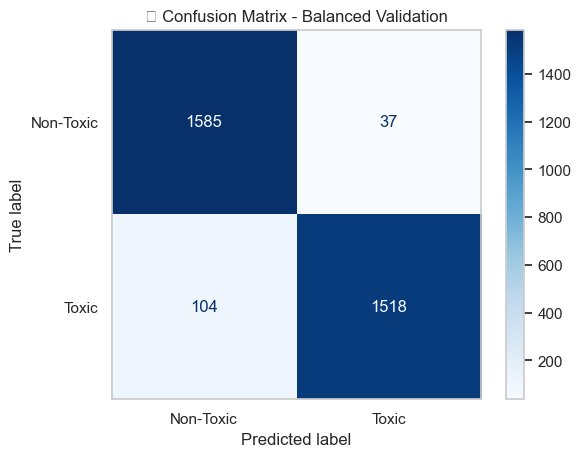

/opt/anaconda3/envs/my_nltk_env/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


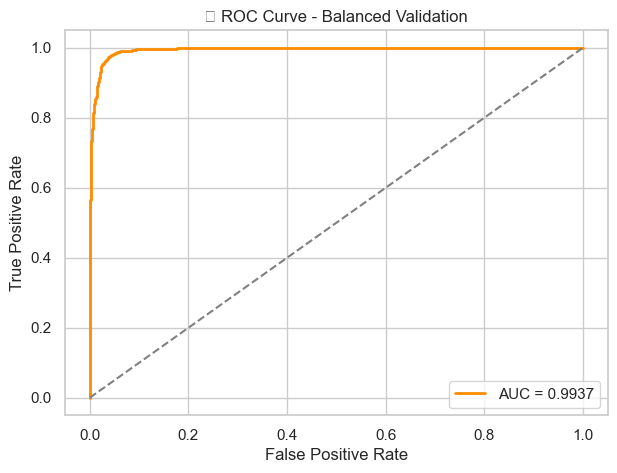

In [98]:
# Plot confusion matrix and ROC
plot_confusion_and_roc(all_labels, all_preds, all_probs, label="Balanced Validation")

In [116]:
def explanation_overlap(shap_values_clean, shap_values_adv, top_k=5):
    # Get top K important tokens from SHAP
    tokens_clean = shap_values_clean.data
    scores_clean = shap_values_clean.values[:, 1]
    top_clean = set([token for token, _ in sorted(zip(tokens_clean, scores_clean), key=lambda x: abs(x[1]), reverse=True)[:top_k]])

    tokens_adv = shap_values_adv.data
    scores_adv = shap_values_adv.values[:, 1]
    top_adv = set([token for token, _ in sorted(zip(tokens_adv, scores_adv), key=lambda x: abs(x[1]), reverse=True)[:top_k]])

    # Jaccard Overlap
    overlap = len(top_clean & top_adv) / len(top_clean | top_adv) if top_clean | top_adv else 0
    return overlap

In [121]:

final_clean_df = pd.read_csv("data/train.csv")
adversarial_df = pd.read_csv("data/adversarial_train_full_ALL.csv")
print(f"Total rows: {len(df)}")

print(df.columns)

clean_subset = final_clean_df[['comment_text']].sample(n=10, random_state=42)
adv_subset = adversarial_df[['adversarial_text']].sample(n=10, random_state=42)

clean_texts = clean_subset['comment_text'].tolist()
adv_texts = adv_subset['adversarial_text'].tolist()

overlap_scores = []

# Let's assume you have two lists: clean_texts and adv_texts
for clean, adv in zip(clean_texts, adv_texts):
    try:
        shap_clean = explainer([clean])[0]
        shap_adv = explainer([adv])[0]
        score = explanation_overlap(shap_clean, shap_adv, top_k=5)
        overlap_scores.append(score)
    except Exception as e:
        print("❌ SHAP error:", e)

Total rows: 654
Index(['text', 'predicted_label', 'confidence', 'important_tokens', 'flag'], dtype='object')


PartitionExplainer explainer: 2it [00:17, 17.35s/it]               
PartitionExplainer explainer: 2it [00:15, 15.01s/it]               
PartitionExplainer explainer: 2it [00:12, 12.71s/it]               
PartitionExplainer explainer: 2it [00:11, 11.29s/it]               
PartitionExplainer explainer: 2it [00:12, 12.39s/it]               
PartitionExplainer explainer: 2it [00:18, 18.23s/it]               
PartitionExplainer explainer: 2it [00:11, 11.70s/it]               
PartitionExplainer explainer: 2it [00:27, 27.39s/it]               
PartitionExplainer explainer: 2it [00:16, 16.72s/it]               
PartitionExplainer explainer: 2it [00:11, 11.65s/it]               
PartitionExplainer explainer: 2it [00:11, 11.97s/it]               
PartitionExplainer explainer: 2it [00:13, 13.86s/it]               
PartitionExplainer explainer: 2it [00:20, 20.79s/it]               
PartitionExplainer explainer: 2it [00:32, 32.17s/it]               
PartitionExplainer explainer: 2it [00:24, 24.91s

🔢 Average EOS: 0.0361
📉 Min EOS: 0.0000 | 📈 Max EOS: 0.2500


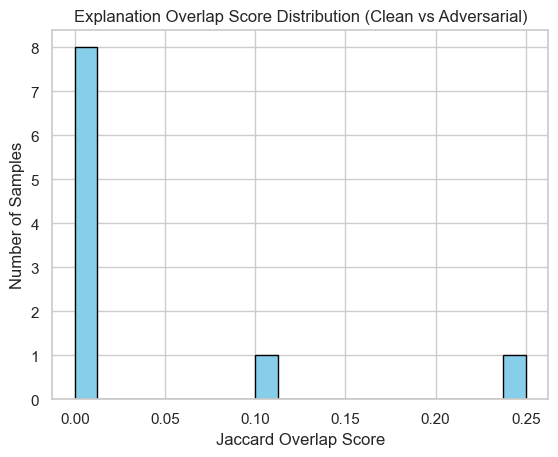

In [122]:
import matplotlib.pyplot as plt

print(f"🔢 Average EOS: {np.mean(overlap_scores):.4f}")
print(f"📉 Min EOS: {np.min(overlap_scores):.4f} | 📈 Max EOS: {np.max(overlap_scores):.4f}")

# Plot Histogram
plt.hist(overlap_scores, bins=20, color='skyblue', edgecolor='black')
plt.title("Explanation Overlap Score Distribution (Clean vs Adversarial)")
plt.xlabel("Jaccard Overlap Score")
plt.ylabel("Number of Samples")
plt.grid(True)
plt.show()

PartitionExplainer explainer: 2it [00:17, 17.33s/it]               
PartitionExplainer explainer: 2it [00:13, 13.90s/it]               
PartitionExplainer explainer: 2it [00:11, 11.91s/it]               
PartitionExplainer explainer: 2it [00:10, 10.63s/it]               
PartitionExplainer explainer: 2it [00:11, 11.17s/it]               
PartitionExplainer explainer: 2it [00:17, 17.42s/it]               
PartitionExplainer explainer: 2it [00:11, 11.42s/it]               
PartitionExplainer explainer: 2it [00:27, 27.55s/it]               
PartitionExplainer explainer: 2it [00:17, 17.47s/it]               
PartitionExplainer explainer: 2it [00:11, 11.59s/it]               
PartitionExplainer explainer: 2it [00:11, 11.42s/it]               
PartitionExplainer explainer: 2it [00:13, 13.59s/it]               
PartitionExplainer explainer: 2it [00:20, 20.05s/it]               
PartitionExplainer explainer: 2it [00:31, 31.64s/it]               
PartitionExplainer explainer: 2it [00:25, 25.40s

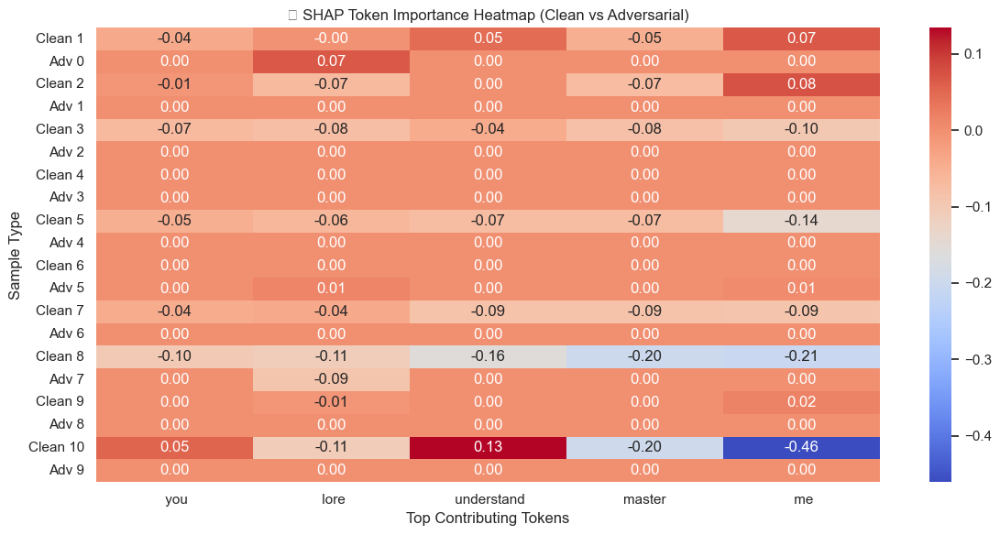

In [124]:
import shap
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
# Create SHAP explainer (assuming classifier pipeline exists)
explainer = shap.Explainer(classifier)

# Store heatmap data
shap_matrix = []
labels = []

for clean, adv in zip(clean_texts, adv_texts):
    try:
        # Get SHAP values
        shap_clean = explainer([clean])[0]
        shap_adv = explainer([adv])[0]

        # Get top tokens (by absolute value)
        values_clean = shap_clean.values[:, 1]  # class 1
        values_adv = shap_adv.values[:, 1]

        tokens_clean = shap_clean.data
        tokens_adv = shap_adv.data

        # Top 5 tokens (by SHAP magnitude)
        top_indices = np.argsort(np.abs(values_clean))[-5:]
        top_tokens = [tokens_clean[i] for i in top_indices]

        # Store SHAP values for both clean & adversarial
        clean_row = [values_clean[tokens_clean.tolist().index(tok)] if tok in tokens_clean else 0 for tok in top_tokens]
        adv_row = [values_adv[tokens_adv.tolist().index(tok)] if tok in tokens_adv else 0 for tok in top_tokens]

        shap_matrix.append(clean_row)
        labels.append(f"Clean {len(labels)//2 + 1}")

        shap_matrix.append(adv_row)
        labels.append(f"Adv {len(labels)//2}")

    except Exception as e:
        print("❌ SHAP Error:", e)

# Convert to NumPy
shap_matrix = np.array(shap_matrix)

# Plot heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(shap_matrix, annot=True, fmt=".2f", cmap="coolwarm", xticklabels=top_tokens, yticklabels=labels)
plt.title("🔍 SHAP Token Importance Heatmap (Clean vs Adversarial)")
plt.xlabel("Top Contributing Tokens")
plt.ylabel("Sample Type")
plt.tight_layout()
plt.show()